In [164]:
library(dplyr)   
library(caret)
library(tidyverse)
library(car)
library(MASS) # for chisq
library(descr) # for crosstable

options(repr.plot.width = 20, repr.plot.height =10, repr.plot.res = 500)

load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_iniziale.Rdata")
df <- DatiUsati1
rm(DatiUsati1)

In [165]:
load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df2022.Rdata")
df_val <- df2022
rm(df2022) #dati 2022

In [166]:
dim(df)

[1] 1453 1874

In [167]:
dim(df_val)

[1]  414 2011

In [168]:
df <- df[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps",
           "thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","totalInfusCristalloidi","totalInfusColloidal","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [169]:
df_val <- df_val[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps",
           "thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","totalInfusCristalloidi","totalInfusColloidal","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [170]:
df <- rbind(df,df_val) #unisco dati 2018-2021 con quelli del 2022

In [171]:
df[which(rowMeans(!is.na(df)) >= 0.15), ]

,patientKey,icuAdmDate__icuAdmDate,icuAdmDate__icuAdmTime,centreCode,genderClear,age,degenzaPreTra,admWard_RIC_PED,typeStatus_RIC,pulmonarHypertension,...,comorbidities_cerDis_RIC,comorbidities_hemiParaQuadr_RIC,comorbidities_neuro_RIC,comorbidities_modRenal_RIC,comorbidities_diab1_RIC,comorbidities_diab2NoIns_RIC,comorbidities_diab2Ins_RIC,comorbidities_drugIndCoag_RIC,comorbidities_antiaggrTherapy_RIC,comorbidities_severePsychosis_RIC
NA.7,P-IT126-4182,2018-01-01,16:16,IT126,Male,56,1,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,0,0,0,0
NA.160,P-IT126-4336,2018-03-23,16:37,IT126,Male,60,1,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,0,0,0,0
NA.209,P-IT126-4384,2018-04-09,13:03,IT126,Male,62,1,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,0,0,0,0
NA.493,P-IT126-4650,2018-09-09,11:45,IT126,Male,56,0,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,1,0,0,0
NA.519,P-IT126-4675,2018-09-25,16:35,IT126,Male,61,1,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,0,0,0,0
NA.531,P-IT126-4687,2018-10-04,13:30,IT126,Male,57,1,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,0,0,0,0
NA.535,P-IT126-4691,2018-09-28,13:42,IT126,Male,61,1,medicalWard,emergSurgical,NA,...,0,0,0,0,0,1,0,0,1,0
NA.537,P-IT126-4693,2018-10-05,14:36,IT126,Male,58,1,surgicalWard,emergSurgical,NA,...,0,0,0,0,0,1,0,0,0,0
NA.540,P-IT126-4695,2018-10-09,12:57,IT126,Female,65,1,medicalWard,emergSurgical,responsNo,...,1,0,0,0,0,0,1,0,0,0
NA.553,P-IT126-4708,2018-10-12,18:27,IT126,Female,28,1,medicalWard,emergSurgical,responsNo,...,0,0,0,0,0,0,0,0,0,0


In [172]:
df <- df[which(rowMeans(!is.na(df)) >= 0.15), ]

In [173]:
df <- df[df$age >= 18,]

In [174]:
# deleting combined transplant patients

load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2018/tabellaUM_OT.Rdata")

OT1 <- tabellaUM_OT
rm(tabellaUM_OT)


patients_rem <- c()


patients1 <- OT1[ OT1$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT1_rem <- OT1[!OT1$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients1){
    if (i %in% OT1_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}



load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2019/tabellaUM_OT.Rdata")

OT2 <- tabellaUM_OT
rm(tabellaUM_OT)


patients2 <- OT2[ OT2$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT2_rem <- OT2[!OT2$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients2){
    if (i %in% OT2_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}


load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2020/tabellaUM_OT.Rdata")

OT3 <- tabellaUM_OT
rm(tabellaUM_OT)

patients3 <- OT3[ OT3$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT3_rem <- OT3[!OT3$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients3){
    if (i %in% OT3_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}

load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2021/tabellaUM_OT.Rdata")

OT4 <- tabellaUM_OT
rm(tabellaUM_OT)

patients4 <- OT4[ OT4$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT4_rem <- OT4[!OT4$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients4){
    if (i %in% OT4_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}


df <- (df[!(df$patientKey %in% patients_rem),])


In [175]:
df <- df[!(df$liverDisords_hepatFulm %in% 1)
          & !(df$liverDisords_subAcute %in% 1) ,]   # deleting retransplant, fulminant hepatitis, acute liver failure

df <- subset(df, select= -c(liverDisords_hepatFulm,liverDisords_subAcute,prevLiverTransplant))

In [176]:
# colestatiche




df <-  df %>% 
  mutate(colestatiche = case_when(liverDisords_cirrhosisBiliaryPrimitiv==1|liverDisords_cirrhosisBiliarySecond==1|
                                  liverDisords_primitScleroColangitis==1|
          liverDisords_extraEpathiBileDucts==1|liverDisords_otherCongenitBilia==1|
                                  liverDisords_otherCholestaticDisease==1~ 1,
                                  TRUE~ 0))

df$colestatiche <- as.factor(df$colestatiche)

df <- subset(df, select= - c(liverDisords_cirrhosisBiliaryPrimitiv,liverDisords_cirrhosisBiliarySecond,
                             liverDisords_primitScleroColangitis,liverDisords_extraEpathiBileDucts,
                            liverDisords_otherCongenitBilia, liverDisords_otherCholestaticDisease))



#rare

df <-  df %>% 
  mutate(rare = case_when(liverDisords_Hemochromatosis == 1|liverDisords_cirrhosisCryptogenetic == 1|
    liverDisords_cirrhosisOtherRaison == 1|liverDisords_otherIndication == 1|liverDisords_wilsonDisease == 1|
    liverDisords_cirrhosisDrugs == 1| liverDisords_buddChiariSyndrome == 1 | 
                          liverDisords_polycysticDisease == 1 | liverDisords_cirrhosisAutoimmune == 1 ~ 1,
                          TRUE ~ 0))

df$rare <- as.factor(df$rare)

df <- subset(df, select= - c(liverDisords_Hemochromatosis,liverDisords_cirrhosisCryptogenetic,
                             liverDisords_cirrhosisOtherRaison,liverDisords_otherIndication,liverDisords_wilsonDisease,
                            liverDisords_buddChiariSyndrome,liverDisords_polycysticDisease,liverDisords_cirrhosisAutoimmune))


#virali

df <-  df %>% 
  mutate(virali = case_when(liverDisords_cirrhosisVirusC == 1|liverDisords_cirrhosisVirusB == 1|
                            liverDisords_cirrhosisVirusD == 1|
                            liverDisords_cirrhosisVirusOther == 1 ~ 1,
                            TRUE ~ 0))

df$virali <- as.factor(df$virali)

df <- subset(df, select= - c(liverDisords_cirrhosisVirusC,liverDisords_cirrhosisVirusB,
                             liverDisords_cirrhosisVirusD,liverDisords_cirrhosisVirusOther))



#tumore

df <-  df %>% 
  mutate(tumore = case_when(liverDisords_HCCstageI == 1 | liverDisords_HCCstageII == 1 ~ 1,                 
                            TRUE ~ 0))

df$tumore <- as.factor(df$tumore)

df <- subset(df, select= - c(liverDisords_HCCstageI,liverDisords_HCCstageII))

In [177]:
#respiratorie

df <- df %>% 
    mutate(comorbidities_respiratorie = ifelse( comorbidities_asthma_RIC == 1 | comorbidities_modCOPD_RIC == 1 |
                                               comorbidities_sevCOPD_RIC == 1 | comorbidities_restLunDis_RIC == 1 |
                                               oxygenTherapy == "responsYes", 1, 0))

df$comorbidities_respiratorie <- as.factor(df$comorbidities_respiratorie)
df <- subset(df, select = -c(comorbidities_asthma_RIC,comorbidities_modCOPD_RIC, comorbidities_sevCOPD_RIC, 
                             comorbidities_restLunDis_RIC, oxygenTherapy ))






#cardiovascolari

df <- df %>% 
    mutate(comorbidities_cardiovascolari = ifelse( comorbidities_myocard_RIC == 1 | comorbidities_heartFail2_RIC == 1 |
                                               comorbidities_heartFail4_RIC == 1 | comorbidities_arrhythmia_RIC == 1 |
                                               comorbidities_perVascDis_RIC == 1, 1, 0))

df$comorbidities_cardiovascolari <- as.factor(df$comorbidities_cardiovascolari)
df <- subset(df, select = -c(comorbidities_myocard_RIC,comorbidities_heartFail2_RIC, comorbidities_heartFail4_RIC, 
                             comorbidities_arrhythmia_RIC, comorbidities_perVascDis_RIC ))


#neurologiche

df <- df %>% 
    mutate(comorbidities_neurologiche = ifelse( comorbidities_dementia_RIC == 1 | comorbidities_cerDis_RIC == 1 |
                                               comorbidities_hemiParaQuadr_RIC == 1 | comorbidities_neuro_RIC == 1 , 1, 0))

df$comorbidities_neurologiche <- as.factor(df$comorbidities_neurologiche)
df <- subset(df, select = -c(comorbidities_dementia_RIC,comorbidities_cerDis_RIC, comorbidities_hemiParaQuadr_RIC, 
                             comorbidities_neuro_RIC))


#renali

df <- df %>% 
    mutate(comorbidities_renali = ifelse( comorbidities_modRenal_RIC == 1 | comorbidities_modRenal_RIC == 1, 1, 0))

df$comorbidities_renali <- as.factor(df$comorbidities_renali)
df <- subset(df, select = -c(comorbidities_modRenal_RIC,comorbidities_modRenal_RIC))


#endocrine

df <-  df %>% 
  mutate(comorbidities_diabete = case_when(comorbidities_diab2NoIns_RIC == 1 ~ 1,
  comorbidities_diab1_RIC == 0 & comorbidities_diab2Ins_RIC == 0 & comorbidities_diab2NoIns_RIC == 0 ~ 0,
  comorbidities_diab1_RIC == 1 |comorbidities_diab2Ins_RIC == 1 ~ 2))

df$comorbidities_diabete <- as.factor(df$comorbidities_diabete)
df <- subset(df, select= - c(comorbidities_diab1_RIC,comorbidities_diab2Ins_RIC,comorbidities_diab2NoIns_RIC))

#scoagulazione

df <- df %>% 
    mutate(comorbidities_scoagulazione = ifelse( comorbidities_drugIndCoag_RIC == 1 |
                                                comorbidities_antiaggrTherapy_RIC == 1 , 1, 0))

df$comorbidities_scoagulazione <- as.factor(df$comorbidities_scoagulazione)
df <- subset(df, select = -c(comorbidities_drugIndCoag_RIC,comorbidities_antiaggrTherapy_RIC))

In [178]:
aggregate(sapply(df,class), by=list(sapply(df,class)), FUN=length)

Group.1,x
character,3
Date,1
factor,54
numeric,31


In [179]:
colnames(select_if(df, function(col) is.character(col)))

[1] "patientKey"             "icuAdmDate__icuAdmTime" "centreCode"

In [180]:
df$CentreCode <- as.factor(df$centreCode)

In [181]:
tmp <- unname(unlist(quantile(df$degenzaPostTraOSP, probs = c(0.9), na.rm=TRUE)))
df <- df %>% mutate(degenzaPostTraOSP = case_when(hospOutcome_RIC  %in% "hospDead" ~ tmp,
                                                  icuMortality %in% 1 ~ tmp,
                                                  TRUE ~ degenzaPostTraOSP))  #add penalty in degenzaPostTraOSP for patients who died

In [182]:
df1 <- df %>% filter(degenzaPostTraOSP <= 12)

df2 <- df %>% filter(degenzaPostTraOSP > 12)

In [183]:
paste("I pazienti con degenza minore o uguale a 12 giorni sono", nrow(df1))
paste("I pazienti con degenza superiore a 12 giorni", nrow(df2))

[1] "I pazienti con degenza minore o uguale a 12 giorni sono 569"

[1] "I pazienti con degenza superiore a 12 giorni 1017"

In [184]:
# Data

print("<= 12")
summary(df1$icuAdmDate__icuAdmDate)

print("> 12")
summary(df2$icuAdmDate__icuAdmDate)

[1] "<= 12"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-01-05" "2019-12-02" "2021-01-05" "2020-11-14" "2021-10-17" "2022-12-02"

[1] "> 12"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-01-01" "2019-10-14" "2020-10-17" "2020-10-01" "2021-10-09" "2022-12-16"

In [185]:
# Orario (è una variabile "character" quindi posso confrontare solo in questo modo senza fare ulteriori modifche)

print("<= 12")
table(df1$icuAdmDate__icuAdmTime)

print("> 12")
table(df2$icuAdmDate__icuAdmTime)

[1] "<= 12"



00:05 00:10 00:15 00:28 00:30 00:34 00:45 00:50 01:00 01:02 01:15 01:25 01:26 
    1     1     2     1     2     1     1     1     3     1     1     1     1 
01:27 01:30 01:35 01:45 01:53 01:57 02:00 02:10 02:15 02:30 02:45 02:49 02:59 
    1     4     1     2     1     1     6     1     2     2     1     1     1 
03:00 03:07 03:10 03:12 03:18 03:29 03:30 03:36 03:43 03:45 03:56 04:00 04:30 
    2     1     1     1     1     1     1     1     1     1     1     5     3 
04:33 04:35 04:42 05:00 05:05 05:10 05:35 06:00 06:25 06:27 06:30 06:59 07:30 
    1     1     1     2     1     1     1     1     1     1     2     1     1 
07:49 08:30 08:49 09:10 09:30 10:00 10:10 10:30 10:44 11:00 11:19 11:24 11:30 
    1     1     1     1     1     5     2     1     1     1     1     1     1 
11:36 11:45 11:58 12:00 12:03 12:05 12:13 12:15 12:21 12:25 12:30 12:32 12:35 
    1     1     1     5     1     1     1     1     1     1     4     1     1 
12:36 12:38 12:42 12:48 12:53 12:57 12:58 13:00 13:

[1] "> 12"



00:00 00:10 00:15 00:20 00:23 00:25 00:30 00:31 00:35 00:40 00:45 00:50 00:56 
    1     2     1     4     1     1     4     1     1     1     1     1     1 
01:00 01:10 01:17 01:23 01:24 01:29 01:30 01:35 01:40 01:45 01:50 02:00 02:10 
   10     1     1     1     1     1     7     1     1     2     1     8     1 
02:28 02:30 02:40 03:00 03:29 03:30 03:31 03:40 03:50 03:53 03:56 04:00 04:01 
    1     1     1     4     1     4     1     1     3     1     1     4     1 
04:07 04:14 04:15 04:24 04:25 04:30 04:36 04:45 04:56 04:58 05:00 05:15 05:18 
    1     1     1     1     1     4     1     1     1     1     4     1     1 
05:30 05:41 05:47 05:50 06:00 06:13 06:20 06:22 06:30 06:37 06:45 07:00 07:01 
    1     1     1     1     2     1     1     1     2     1     2     2     1 
07:07 07:10 07:11 07:15 07:25 07:27 07:30 07:33 07:35 07:40 08:00 08:09 08:24 
    1     3     1     1     1     1     3     1     1     1     8     1     1 
08:30 08:50 09:00 09:25 09:30 09:42 10:00 10:03 10:

In [186]:
descrittiva_discrete <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {
            
            par(mfrow=c(1,2))
            barplot(table(df1[[column]])/nrow(df1), main="<= 12", col="blue", ylim = c(0, 1))

            barplot(table(df2[[column]])/nrow(df2), main="> 12", col="blue", ylim = c(0, 1))
            
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
            
        }
        
}




descrittiva_continue <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {


            print("<= 12")
            print(column)
            print(summary(df1[[column]]))

            print("> 12")
            print(column)
            print(summary(df2[[column]]))
            print(wilcox.test(df1[[column]], df2[[column]]))
            
            tmp <- rbind(df1[[column]], df2[[column]])
            cat("deviazione standard: ",sd(tmp,na.rm =TRUE))
            
            cat("\n\n\n\n")
            
        }
}

descrittiva_discrete2 <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            a <- table(factor(df1[[column]], levels = union(names(table(df2[[column]])),names(table(df1[[column]])))))
            b <- table(df2[[column]])
            
            print(column)
            print("<= 12")
            print(prop.table(a))
            
            print("> 12")
            print(prop.table(b))
        
            print(ks.test(a,b))
            
            cat("\n\n\n\n")
    }
}


descrittiva_discrete3 <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            a <- table(factor(df1[[column]], levels = union(names(table(df2[[column]])),names(table(df1[[column]])))))
            b <- table(df2[[column]])
            
            print(column)
        
            print(CrossTable(rbind(a, b),
           fisher = T, chisq = T, expected = T,
           prop.c = F, prop.t = F, prop.chisq = F, 
           sresid = T, format = 'SPSS', simulate.p.value=TRUE))
            
            cat("\n\n\n\n")
    }
}

In [187]:
descrittiva_discrete_tot <- function(df){
        column_names <- colnames(df)
        
        for (column in column_names) {
            
            barplot(table(df[[column]])/nrow(df), main="tot", col="blue", ylim = c(0, 1))
            
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
            
        }
        
}




descrittiva_continue_tot <- function(df){
        column_names <- colnames(df)
        
        for (column in column_names) {


            print("tot")
            print(column)
            print(summary(df[[column]]))


            cat("\n\n\n\n")
            
        }
}

descrittiva_discrete2_tot <- function(df){
        column_names <- colnames(df)
        
        for (column in column_names) {
            
            a <- table(df[[column]])
            
            print(column)
            print("tot")
            print(prop.table(a))
            
            cat("\n\n\n\n")
    }
}




In [188]:
df_discrete1 <- select_if(df1, function(col) is.factor(col))
df_discrete2 <- select_if(df2, function(col) is.factor(col))
                          
                          
df_continue1 <- select_if(df1, function(col) is.numeric(col))
df_continue2 <- select_if(df2, function(col) is.numeric(col))
                          
df_continue_tot <- select_if(df, function(col) is.numeric(col))
df_discrete_tot <- select_if(df, function(col) is.factor(col))

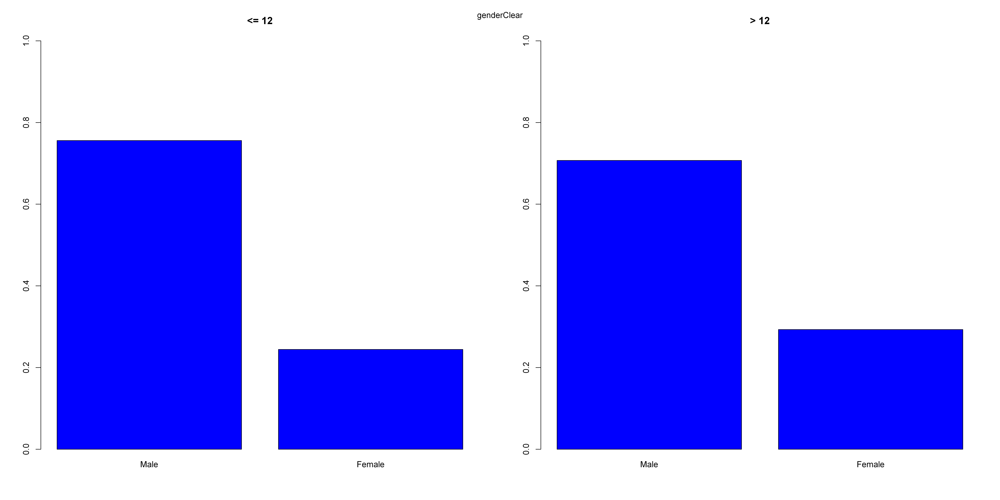

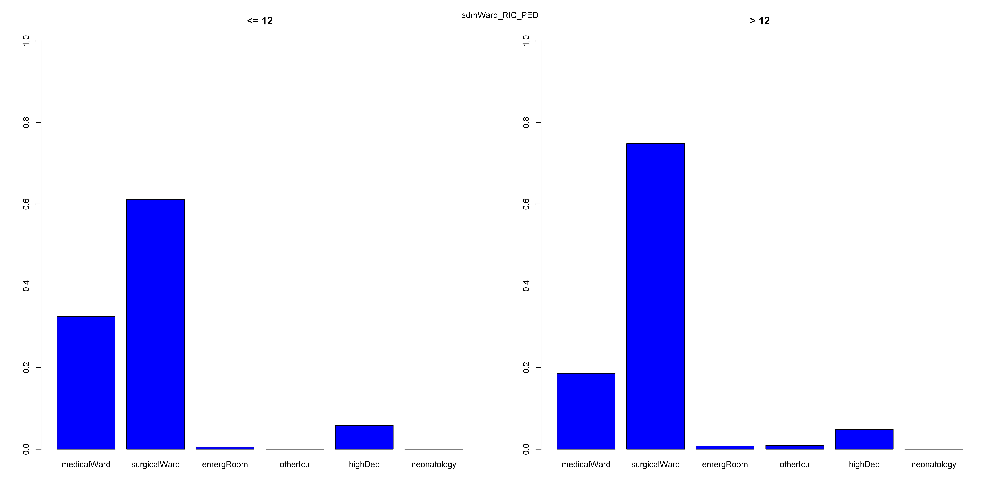

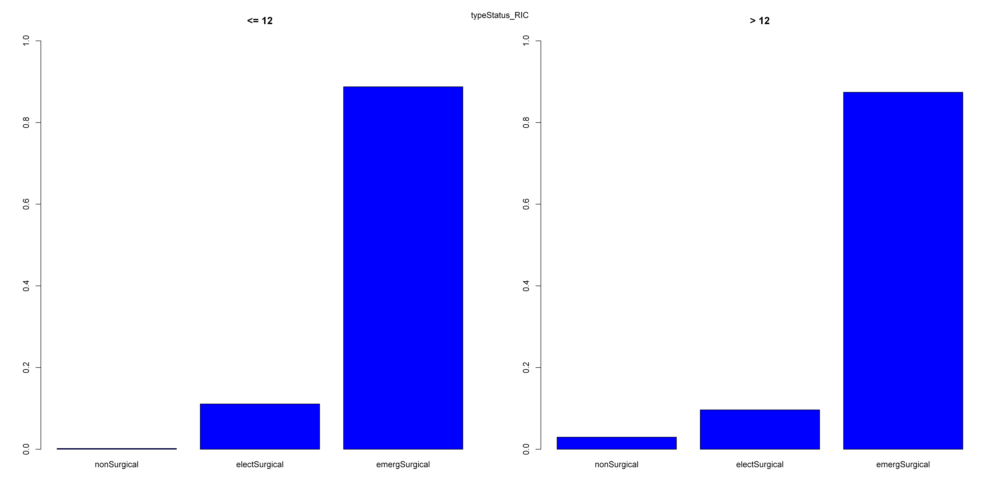

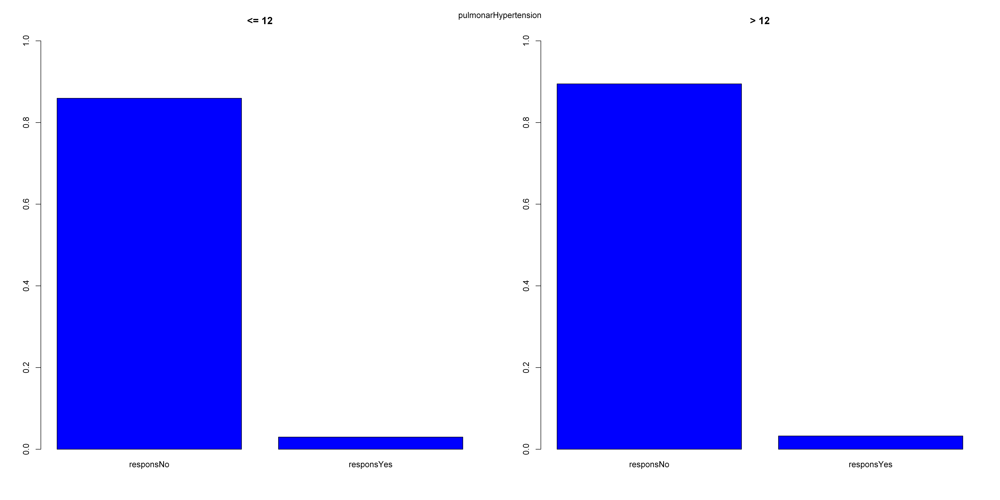

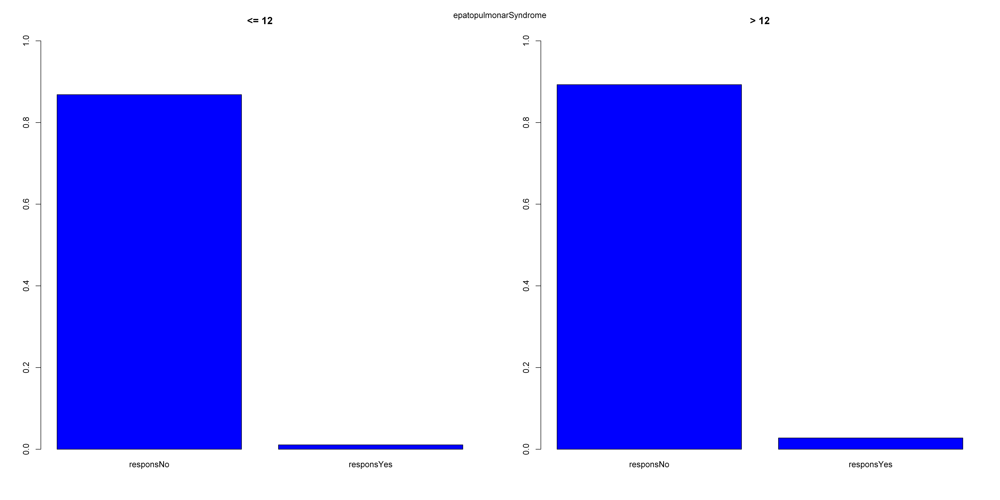

...

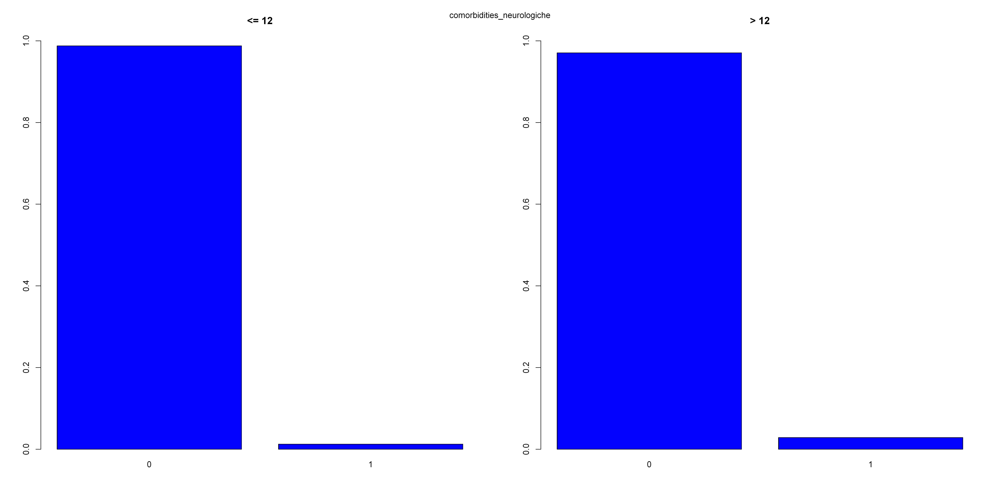

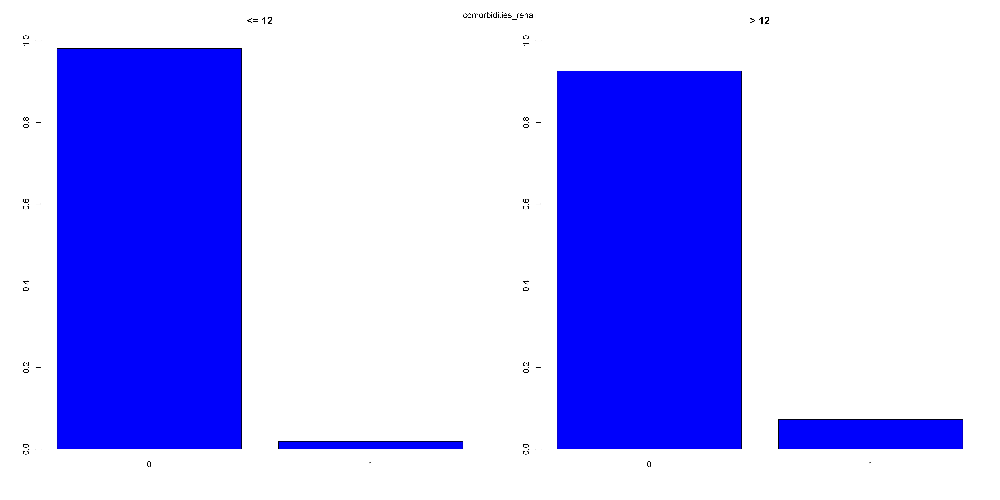

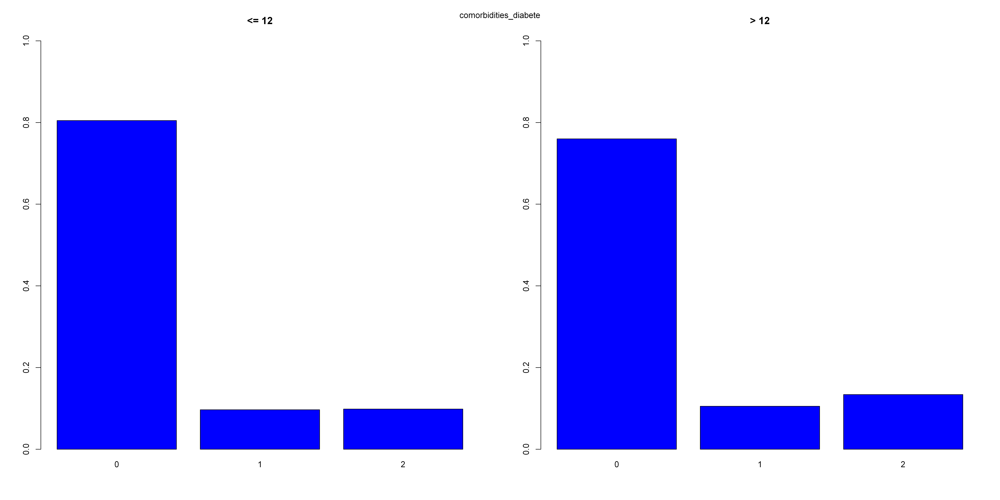

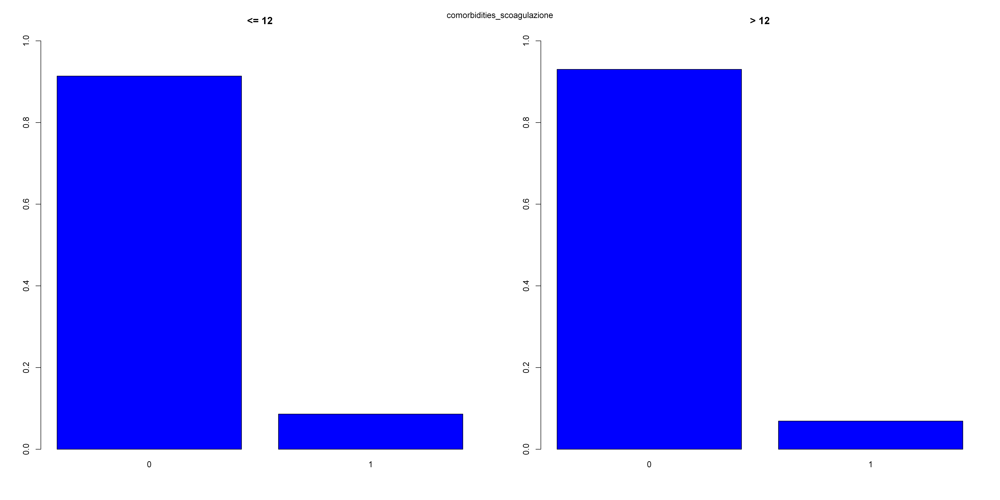

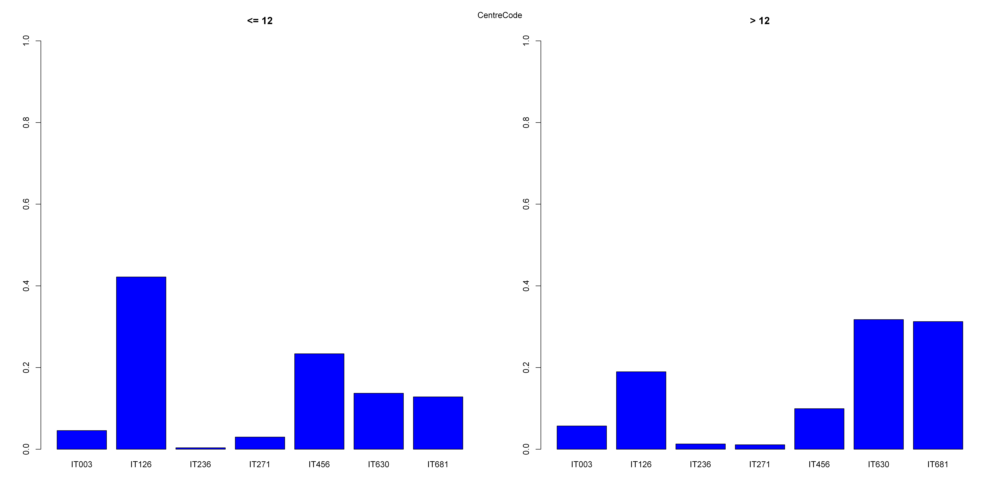

In [189]:
descrittiva_discrete(df_discrete1,df_discrete2)

In [190]:
descrittiva_discrete2(df_discrete1,df_discrete2)

[1] "genderClear"
[1] "<= 12"

     Male    Female 
0.7557118 0.2442882 
[1] "> 12"

     Male    Female 
0.7069813 0.2930187 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "admWard_RIC_PED"
[1] "<= 12"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
 0.325131810  0.611599297  0.005272408  0.000000000  0.057996485  0.000000000 
[1] "> 12"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
 0.186023622  0.749015748  0.007874016  0.008858268  0.048228346  0.000000000 


Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 0.8928
alternative hypothesis: two-sided





[1] "typeStatus_RIC"
[1] "<= 12"

  nonSurgical electSurgical emergSurgical 
  0.001757469   0.110720562   0.887521968 
[1] "> 12"

  nonSurgical electSurgical emergSurgical 
   0.02949853    0.09636185    0.87413963 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 1
alternative hypothesis: two-sided





[1] "pulmonarHypertension"
[1] "<= 12"

 responsNo responsYes 
0.96640316 0.03359684 
[1] "> 12"

 responsNo responsYes 
 0.9650053  0.0349947 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "epatopulmonarSyndrome"
[1] "<= 12"

 responsNo responsYes 
     0.988      0.012 
[1] "> 12"

 responsNo responsYes 
0.97008547 0.02991453 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "BleedingEsophagGastric"

Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.6, p-value = 0.3291
alternative hypothesis: two-sided





[1] "albumInfusOver7Days"
[1] "<= 12"

 responsNo responsYes 
0.92814371 0.07185629 
[1] "> 12"

 responsNo responsYes 
 0.7789586  0.2210414 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "syndromeReperfus"
[1] "<= 12"

  notLevel       mild   moderate     severe 
0.37979798 0.41818182 0.15757576 0.04444444 
[1] "> 12"

  notLevel       mild   moderate     severe 
0.28969957 0.39377682 0.22532189 0.09120172 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.75, p-value = 0.2286
alternative hypothesis: two-sided





[1] "shuntPortedTemp"
[1] "<= 12"

 responsNo responsYes 
 0.9778672  0.0221328 
[1] "> 12"

 responsNo responsYes 
0.97959184 0.02040816 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "anastomTechnic"
[1] "<

Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.4, p-value = 0.8186
alternative hypothesis: two-sided





[1] "organDonorSteadyMacroscopic"
[1] "<= 12"

    under30      30to60       sup60 
0.936908517 0.059936909 0.003154574 
[1] "> 12"

    under30      30to60       sup60 
0.922547332 0.074010327 0.003442341 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 1
alternative hypothesis: two-sided





[1] "organDonorRecondHypoNormoter"
[1] "<= 12"

   Oxygenated NotOxygenated 
   0.94339623    0.05660377 
[1] "> 12"

   Oxygenated NotOxygenated 
    0.9137931     0.0862069 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities_none_RIC"
[1] "<= 12"

        1         0 
0.1019332 0.8980668 
[1] "> 12"

        1         0 
0.0492126 0.9507874 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities

In [191]:
descrittiva_discrete3(df_discrete1,df_discrete2)

[1] "genderClear"
   Cell Contents 
|-------------------------|
|                   Count | 
|         Expected Values | 
|             Row Percent | 
|            Std Residual | 
|-------------------------|

           Male   Female   Total
--------------------------------
a          430      139     569 
         412.2    156.8         
          75.6%    24.4%   35.9%
         0.876   -1.420         
--------------------------------
b          719      298    1017 
         736.8    280.2         
          70.7%    29.3%   64.1%
        -0.655    1.062         
--------------------------------
Total     1149      437    1586 

Statistics for All Table Factors

Pearson's Chi-squared test with simulated p-value
	 (based on 2000 replicates) 
------------------------------------------------------------
Chi^2 = 4.340462      d.f. = NA      p = 0.039 

Pearson's Chi-squared test with simulated p-value
	 (based on 2000 replicates) 
---------------------------------------------------------

Warning message in chisq.test(tab, correct = FALSE, ...):
"cannot compute simulated p-value with zero marginals"
Warning message in chisq.test(tab, correct = FALSE, ...):
"Chi-squared approximation may be incorrect"


   Cell Contents 
|-------------------------|
|                   Count | 
|         Expected Values | 
|             Row Percent | 
|            Std Residual | 
|-------------------------|

         medclWrd   srgclWrd   emergRom   otherIcu   highDep   neontlgy    Total
--------------------------------------------------------------------------------
a            185        348          3          0        33          0      569 
           134.3      398.1        3.9        3.2      29.4        0.0          
            32.5%      61.2%       0.5%       0.0%      5.8%       0.0%    35.9%
           4.379     -2.512     -0.478     -1.797     0.657        NaN          
--------------------------------------------------------------------------------
b            189        761          8          9        49          0     1016 
           239.7      710.9        7.1        5.8      52.6        0.0          
            18.6%      74.9%       0.8%       0.9%      4.8%       0.0%    64.1%

In [192]:
descrittiva_continue(df_continue1, df_continue2)

[1] "<= 12"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  18.00   53.00   59.00   57.34   65.00   75.00 
[1] "> 12"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  19.00   52.00   58.00   56.44   63.00   75.00 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 310293, p-value = 0.01652
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  9.964886



[1] "<= 12"
[1] "degenzaPreTra"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   2.805   1.000 365.000 
[1] "> 12"
[1] "degenzaPreTra"
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-260.000    0.000    1.000    7.546    4.000  304.000 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 238761, p-value = 4.722e-10
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  18.04676



[1] "<= 12"
[1] "bilirubinaTotale"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.200   0.740   1.185   2.594   2.500  88.000      65 
[1] "> 12"
[1] "bilirubinaTotale"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.100   1.240   2.865   6.784   7.505  57.000      75 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 146598, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  7.875716



[1] "<= 12"
[1] "INR"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.900   1.120   1.250   1.374   1.460   6.140      65 
[1] "> 12"
[1] "INR"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.800   1.250   1.500   1.667   1.900  10.000      75 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 151640, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.5635239



[1] "<= 12"
[1] "serumCreatinine"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.3600  0.7000  0.8150  0.8847  0.9500 10.7200      65 
[1] "> 12"
[1] "serumCreatinine"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.230   0.700   0.900   1.072   1.160   7.800      74 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 197243, p-value = 9.59e-08
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.6480758



[1] "<= 12"
[1] "Sodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  122.0   137.0   139.0   138.6   141.0   153.0      67 
[1] "> 12"
[1] "Sodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  119.0   135.0   137.0   136.9   140.0   166.0      76 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 295673, p-value = 2.444e-15
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  4.319735



[1] "<= 12"
[1] "ratioPaO2FiO2"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   50.0   350.0   400.0   395.4   460.5   500.0      73 
[1] "> 12"
[1] "ratioPaO2FiO2"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   97.0   300.0   370.5   358.1   417.5   500.0      79 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 289649, p-value = 1.825e-14
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  87.2342



[1] "<= 12"
[1] "platCountTranspl"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   18.0    64.0    96.5   122.0   152.0   800.0      67 
[1] "> 12"
[1] "platCountTranspl"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   7.00   47.00   72.00   99.33  122.00  749.00      76 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 287704, p-value = 8.344e-12
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  88.7459



[1] "<= 12"
[1] "albumina"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.000   3.200   3.750   3.697   4.200   5.000      68 
[1] "> 12"
[1] "albumina"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.000   3.000   3.390   3.394   3.900   5.000      78 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 298348, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.6767509



[1] "<= 12"
[1] "surgeryDuration"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  180.0   329.2   390.0   408.9   475.0  1220.0      79 
[1] "> 12"
[1] "surgeryDuration"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    180     370     450     464     540    1440      86 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 165741, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  125.3577



[1] "<= 12"
[1] "IntraoperativTransfected"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.000   0.000   1.000   2.408   4.000  25.000      72 
[1] "> 12"
[1] "IntraoperativTransfected"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.000   2.000   4.000   6.048   7.000 117.000      83 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 142523, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  6.52008



[1] "<= 12"
[1] "plasmaFresco"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0       0       0     543    1000    6800      73 
[1] "> 12"
[1] "plasmaFresco"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0     0.0     4.0   943.4  1065.0 50000.0      83 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 204887, p-value = 0.0001188
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  1849.778



[1] "<= 12"
[1] "plasmaPools"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   0.00    0.00    0.00   71.69    0.00 1400.00      72 
[1] "> 12"
[1] "plasmaPools"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0     0.0     0.0   221.2   350.0  2700.0      88 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 166384, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  260.4484



[1] "<= 12"
[1] "doseFibrinogen"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0000  0.0000  0.0000  0.4677  0.0000 10.0000      73 
[1] "> 12"
[1] "doseFibrinogen"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0000  0.0000  0.0000  0.6574  0.0000 15.0000      83 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 214615, p-value = 0.0007816
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  1.541905



[1] "<= 12"
[1] "CRIOprecipitated"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0000  0.0000  0.0000  0.1457  0.0000 18.0000      75 
[1] "> 12"
[1] "CRIOprecipitated"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0000  0.0000  0.0000  0.9968  0.0000 20.0000      89 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 204998, p-value = 1.912e-11
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  2.417936



[1] "<= 12"
[1] "useEmorecuper"
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max.     NA's 
    0.00     0.00     0.00    59.78     0.00 10000.00       75 
[1] "> 12"
[1] "useEmorecuper"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0     0.0     0.0   110.9     0.0 10000.0      83 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 226686, p-value = 0.2124
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  538.4243



[1] "<= 12"
[1] "totalInfusCristalloidi"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0    5500    7000    7380    8700   45000      78 
[1] "> 12"
[1] "totalInfusCristalloidi"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0    5000    7000    8127    9125  200000      85 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 226610, p-value = 0.7655
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  6557.014



[1] "<= 12"
[1] "totalInfusColloidal"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0   200.0   500.0   647.4  1000.0  4000.0      77 
[1] "> 12"
[1] "totalInfusColloidal"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0   200.0   400.0   580.6   800.0  7350.0      86 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 256422, p-value = 0.0001937
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  660.4604



[1] "<= 12"
[1] "Albumina50Comp"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0     500    1000    1049    1600    6000      78 
[1] "> 12"
[1] "Albumina50Comp"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0     400    1000    1191    1812    7000      93 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 216348, p-value = 0.1499
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  893.9814



[1] "<= 12"
[1] "noradrenalineEndSurger"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0000  0.0000  0.0500  0.1166  0.1775  1.5000      79 
[1] "> 12"
[1] "noradrenalineEndSurger"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   0.00    0.00    0.12    0.21    0.30    3.00      85 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 174448, p-value = 7.31e-14
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.2467316



[1] "<= 12"
[1] "intermedLactates"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.500   1.300   2.000   2.633   3.100  16.000      79 
[1] "> 12"
[1] "intermedLactates"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.500   1.515   2.605   3.869   4.900  28.000      87 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 178593, p-value = 1.99e-11
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  3.027917



[1] "<= 12"
[1] "coldIschemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    6.0   360.0   420.0   427.9   494.2  1367.0      77 
[1] "> 12"
[1] "coldIschemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0   350.0   420.0   433.9   496.0  1095.0      90 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 227748, p-value = 0.9681
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  129.4064



[1] "<= 12"
[1] "organDonorAge"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   14.0    53.0    65.0    64.3    75.0   591.0      77 
[1] "> 12"
[1] "organDonorAge"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   5.00   52.00   65.00   61.46   74.00   93.00      96 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 237611, p-value = 0.1306
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  20.53626



[1] "<= 12"
[1] "organDonorHeight"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  138.0   165.0   170.0   169.3   175.0   200.0     152 
[1] "> 12"
[1] "organDonorHeight"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    1.5   162.0   170.0   168.6   175.0   280.0     365 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 138231, p-value = 0.6401
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  11.26195



[1] "<= 12"
[1] "organDonorDrawalSodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  118.0   142.0   148.0   148.1   154.0   178.0     123 
[1] "> 12"
[1] "organDonorDrawalSodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  128.0   143.0   148.0   149.1   155.0   180.0     216 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 167274, p-value = 0.06245
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  8.520228



[1] "<= 12"
[1] "organDonorGammaGT"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   5.00   18.00   33.50   75.63   83.00  700.00     161 
[1] "> 12"
[1] "organDonorGammaGT"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   5.00   18.00   35.50   67.96   75.00  700.00     343 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 137142, p-value = 0.9434
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  98.97125



[1] "<= 12"
[1] "realMELD"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   5.50    8.38   10.48   12.12   14.70   33.23      65 
[1] "> 12"
[1] "realMELD"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   4.21   11.38   16.22   17.61   22.61   50.70      75 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 134377, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  7.307687



[1] "<= 12"
[1] "realMELDNa"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   2.05    8.31   11.21   12.92   16.11   33.91      67 
[1] "> 12"
[1] "realMELDNa"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   2.05   12.52   18.09   19.12   24.95   48.29      76 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 130417, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  7.995366



[1] "<= 12"
[1] "DRI"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.190   2.098   2.470   2.500   2.760   4.530     161 
[1] "> 12"
[1] "DRI"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.170   2.100   2.480   2.481   2.740   7.920     371 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 133400, p-value = 0.7372
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.5870283



[1] "<= 12"
[1] "EDRI"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.130   1.860   2.190   2.188   2.350   3.830     168 
[1] "> 12"
[1] "EDRI"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.160   1.840   2.180   2.159   2.350   3.760     347 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 138560, p-value = 0.3885
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.4644343



[1] "<= 12"
[1] "degenzaPostTraOSP"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   8.000   9.000   8.984  11.000  12.000 
[1] "> 12"
[1] "degenzaPostTraOSP"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  13.00   16.00   21.00   30.22   36.00  371.00 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 0, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  22.70553





## Totale

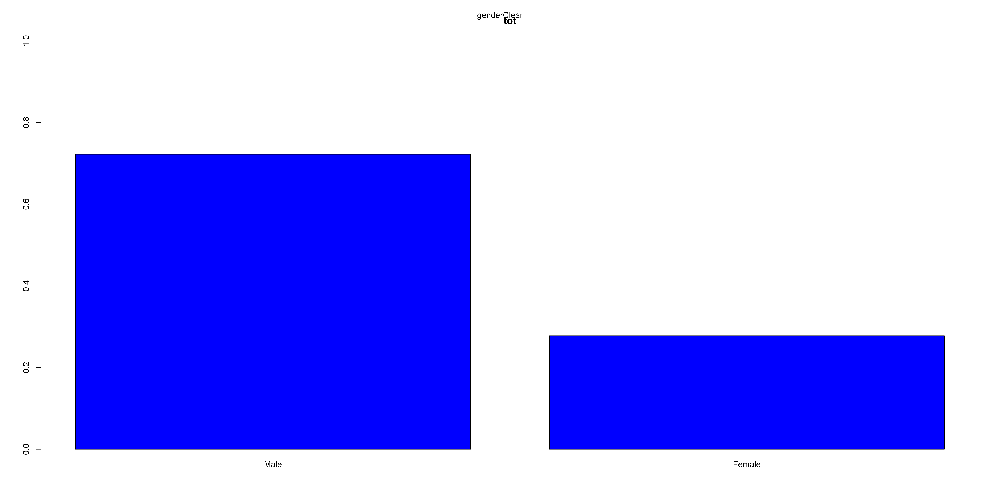

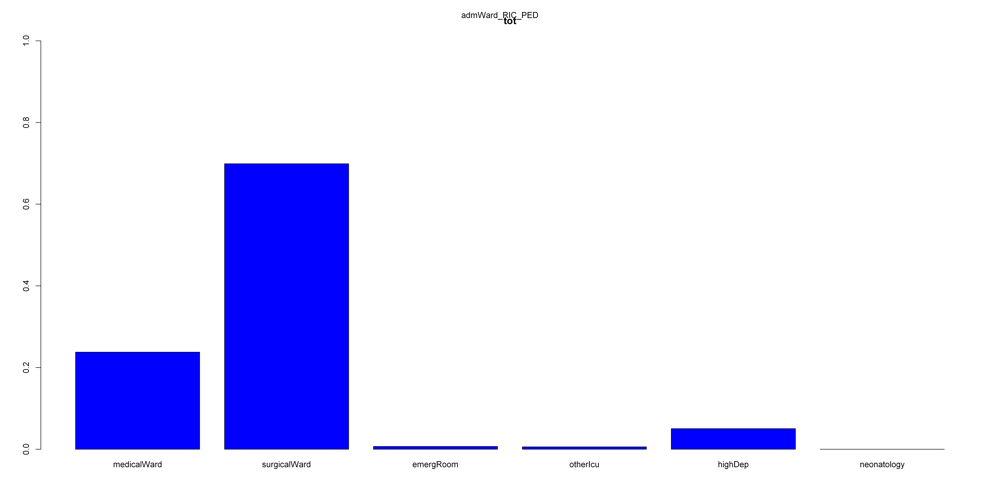

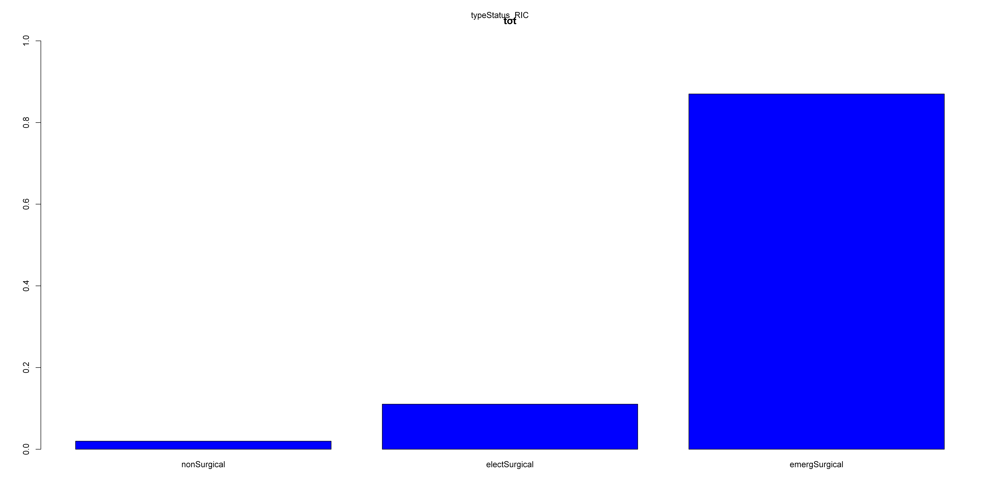

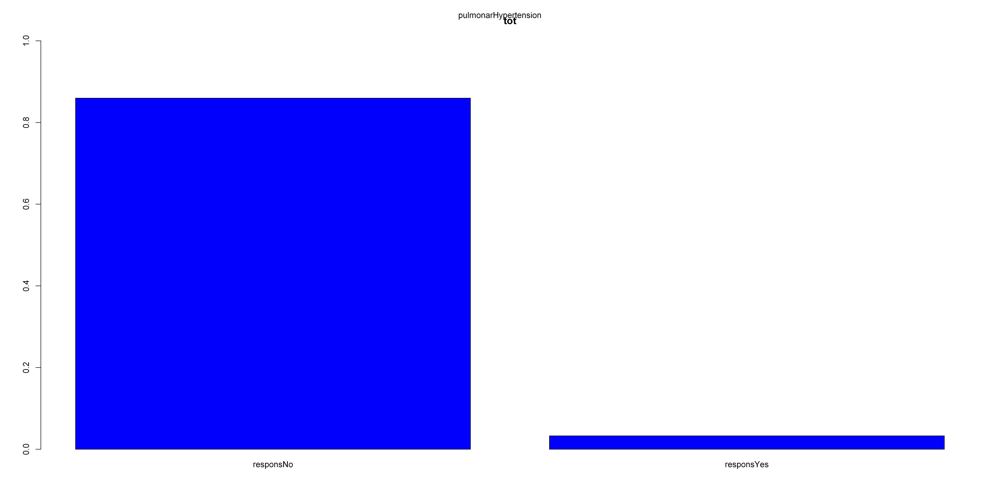

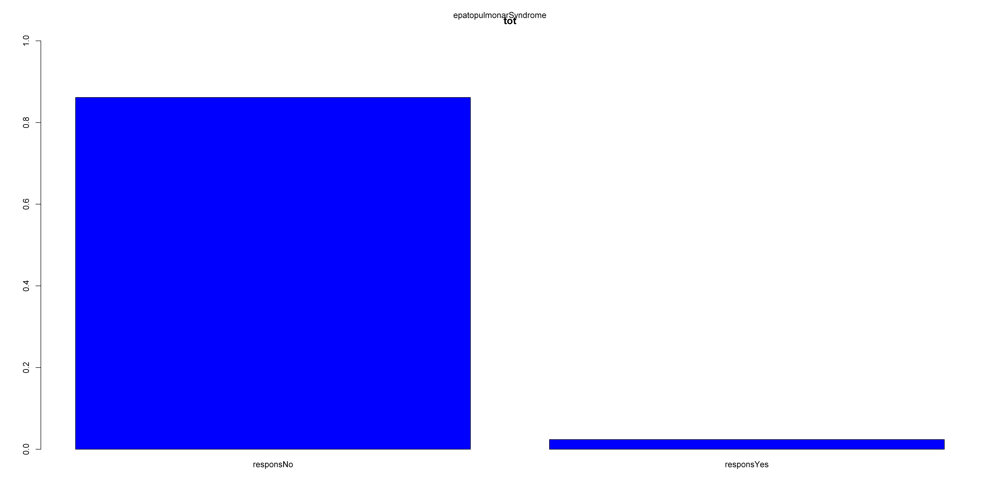

...

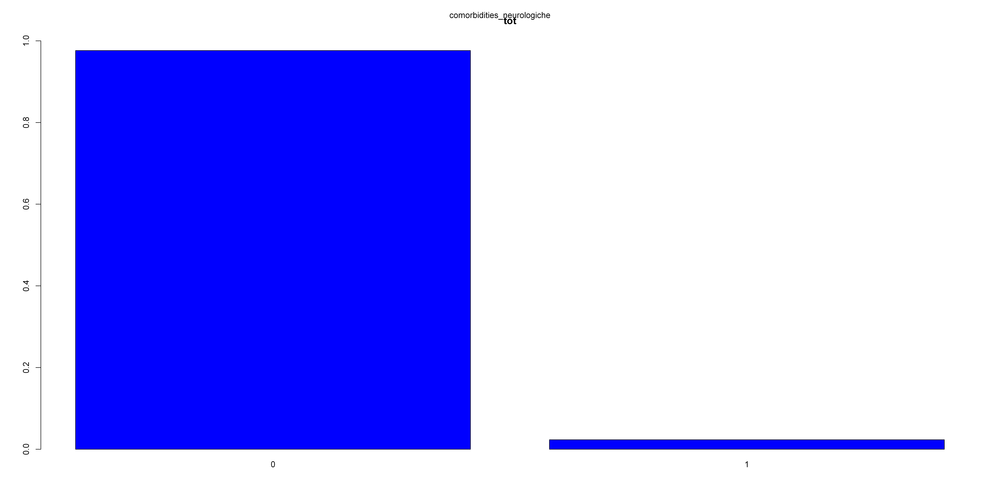

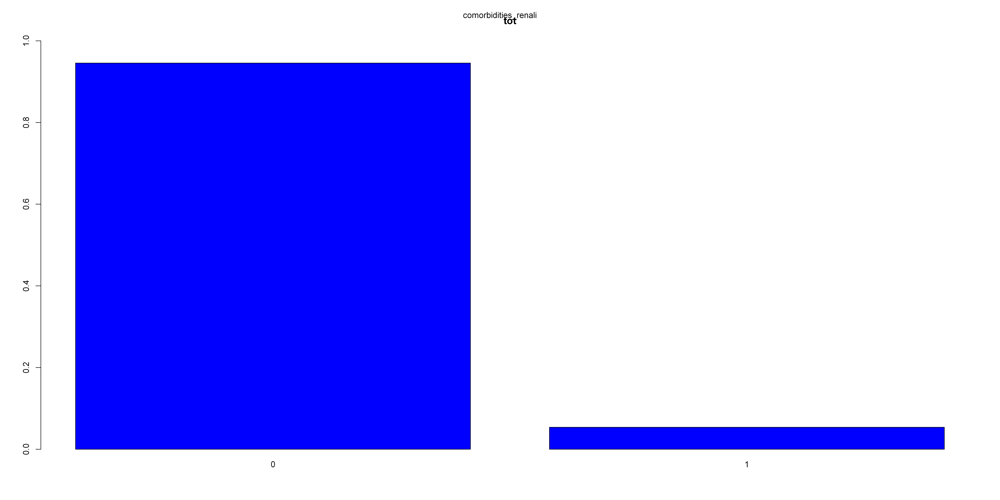

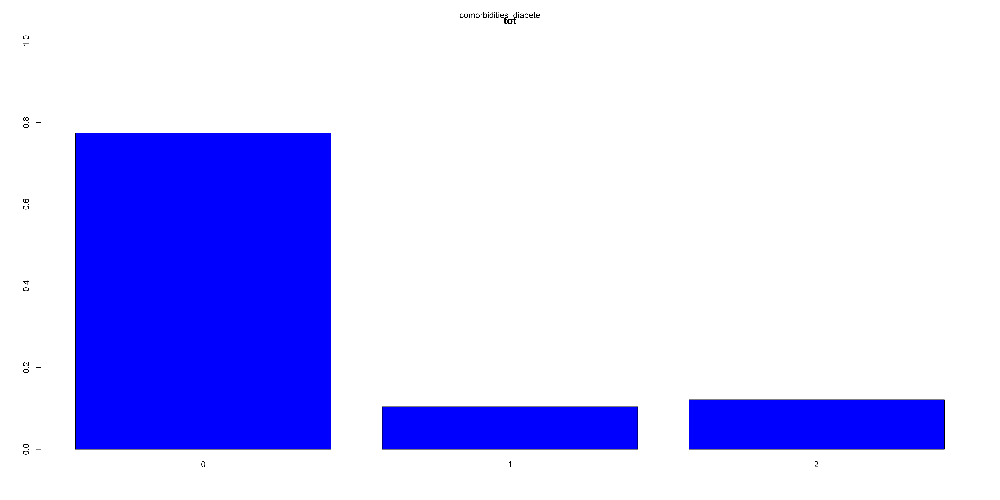

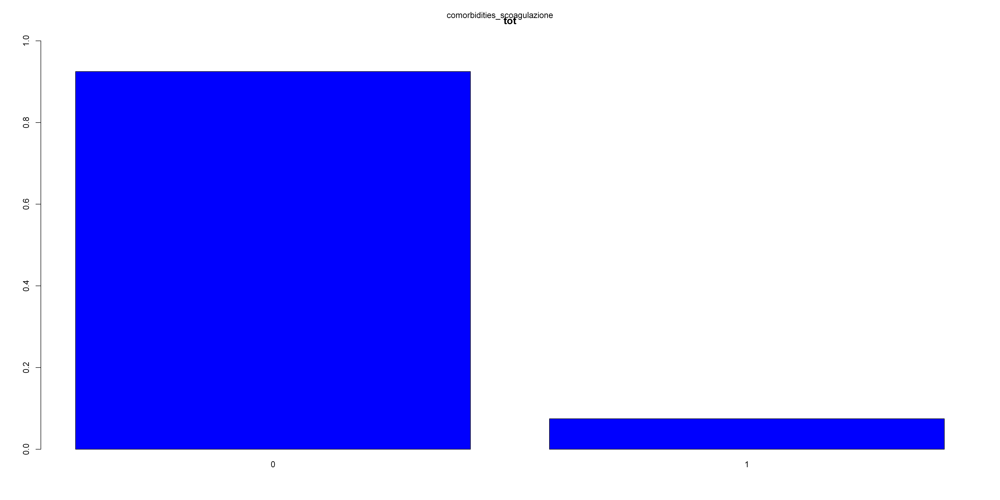

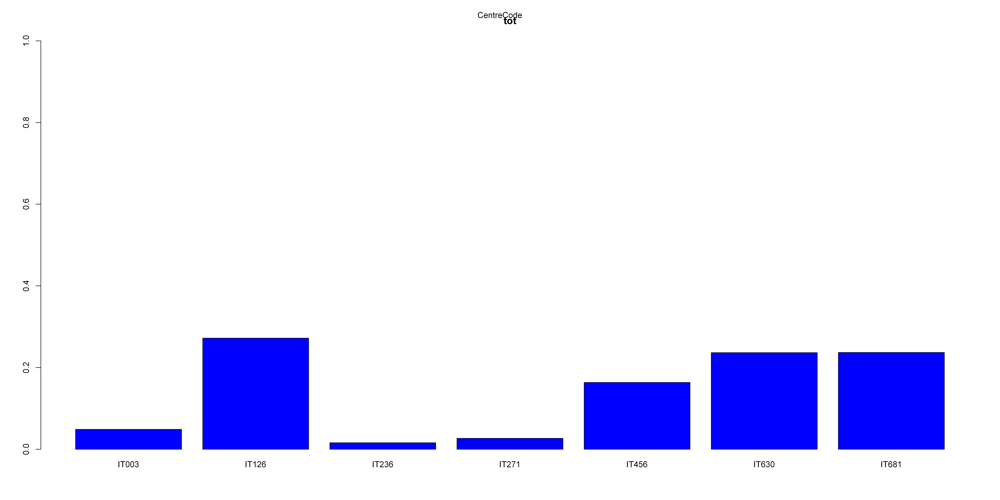

In [193]:
descrittiva_discrete_tot(df_discrete_tot)

In [194]:
descrittiva_discrete2_tot(df_discrete_tot)

[1] "genderClear"
[1] "tot"

     Male    Female 
0.7222851 0.2777149 




[1] "admWard_RIC_PED"
[1] "tot"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
 0.237691002  0.699490662  0.006791171  0.005659310  0.050367855  0.000000000 




[1] "typeStatus_RIC"
[1] "tot"

  nonSurgical electSurgical emergSurgical 
   0.01979638    0.11029412    0.86990950 




[1] "pulmonarHypertension"
[1] "tot"

 responsNo responsYes 
0.96324461 0.03675539 




[1] "epatopulmonarSyndrome"
[1] "tot"

 responsNo responsYes 
0.97316294 0.02683706 




[1] "BleedingEsophagGastric"
[1] "tot"

 responsNo responsYes 
 0.8046925  0.1953075 




[1] "presentRefractAscites"
[1] "tot"

  priority       mild     severe   notLevel 
0.05108557 0.17688378 0.17943806 0.59259259 




[1] "tipps"
[1] "tot"

 responsNo responsYes 
  0.891635   0.108365 




[1] "thrombosisDegreeWithNone"
[1] "tot"

    degreeI    degreeII   degreeIII    degreeIV        None 
0.085381630 0.049805951 0.026520

In [195]:
descrittiva_continue_tot(df_continue_tot)

[1] "tot"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  18.00   53.00   58.00   56.83   64.00   75.00 




[1] "tot"
[1] "degenzaPreTra"
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max.     NA's 
-260.000    0.000    1.000    6.098    1.000  365.000       10 




[1] "tot"
[1] "bilirubinaTotale"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.000   0.965   2.000   5.232   4.790  88.000     193 




[1] "tot"
[1] "INR"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.660   1.190   1.390   1.562   1.750  10.000     193 




[1] "tot"
[1] "serumCreatinine"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.230   0.700   0.850   1.015   1.080  10.720     192 




[1] "tot"
[1] "Sodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  119.0   135.0   138.0   137.5   140.0   166.0     196 




[1] "tot"
[1] "ratioPaO2FiO2"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   50.0   300.0   390.0   369.5   435.0   500.0

In [196]:
dim(df)

[1] 1768   90